# Example for integration with HyperSpy lazy signals

This notebook shows how to process a HyperSpy [lazy signal](http://hyperspy.org/hyperspy-doc/current/user_guide/big_data.html) using LiberTEM, how to create a HyperSpy lazy signal from a LiberTEM DataSet, and how to create a lazy HyperSpy signal from a LiberTEM computation. It uses PyXem for scanning diffraction data support

This notebook requires the `hdbscan` extra. It is incompatible with `pyfftw` that is optionally used in `libertem-blobfinder` because of apparent thread safety issues.

Please note that these features are rather new and not well-tested yet. Bug reports and improvements are much appreciated!

In [2]:
%matplotlib nbagg

In [3]:
import os

import numpy as np
import matplotlib.pyplot as plt

# Modify some LiberTEM internals to pretend not having pyfftw
#import libertem_blobfinder.base.correlation
#libertem_blobfinder.base.correlation.fft = np.fft
#libertem_blobfinder.base.correlation.zeros = np.zeros

#import libertem.utils.threading
#libertem.utils.threading.__has_pyfftw = False

from libertem.api import Context
from libertem.executor.delayed import DelayedJobExecutor
from libertem.udf.sumsigudf import SumSigUDF
from libertem.contrib.daskadapter import make_dask_array
from libertem_blobfinder.common import correlation, patterns
from libertem_blobfinder.udf import refinement
import libertem.analysis.fullmatch as fm

In [4]:
# Use a LiberTEM executor that plays well with the curren Dask scheduler
ctx = Context()

# Alternatively, one could use the LiberTEM Dask scheduler as default Dask scheduler
# Unfortunately, the current BLO reader in Hyperspy doesn't play well with the distributed scheduler
# ctx = Context.make_with("dask-make-default")

/Users/weber/.conda/envs/libertem37/lib/python3.7/site-packages/distributed/node.py:161: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 34461 instead
  f"Port {expected} is already in use.\n"


In [5]:
data_base_path = os.environ.get("TESTDATA_BASE_PATH", "/cachedata/users/clausen/libertem-test-data/")
path = os.path.join(data_base_path, "default.blo")

## Load data using LiberTEM

In [6]:
native_ds = ctx.load('auto', path)

## Create HyperSpy signal from LiberTEM computation

As an example, this uses the LiberTEM blobfinder https://libertem.github.io/LiberTEM-blobfinder/

In [7]:
pick_a = ctx.create_pick_analysis(dataset=native_ds, y=50, x=60)
reference_frame = ctx.run(pick_a)['intensity'].raw_data

In [8]:
zero = (71, 71)
r = 1.5
pattern = patterns.BackgroundSubtraction(radius=r)

In [9]:
peaks = correlation.get_peaks(sum_result=reference_frame, match_pattern=pattern, num_peaks=50)

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


In [10]:
matcher = fm.FullMatcher()

In [11]:
all_match = matcher.full_match(peaks, zero=zero)

In [12]:
match = all_match[0][0]

<IPython.core.display.Javascript object>


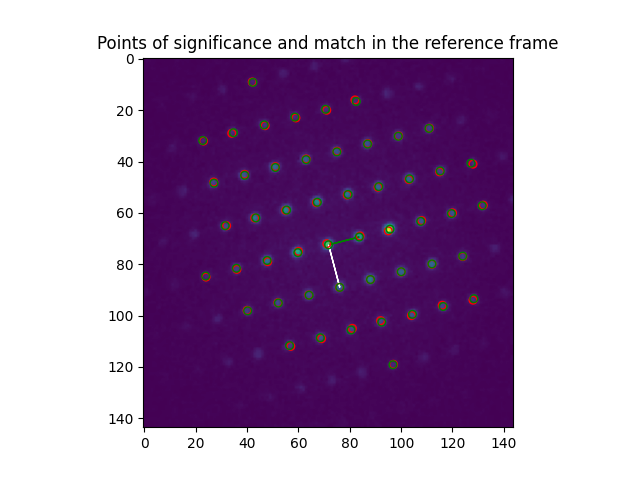

In [13]:
fig, axes = plt.subplots()
axes.imshow(reference_frame)
plt.title("Points of significance and match in the reference frame")

for p in np.flip(match.refineds, axis=1):
    axes.add_artist(plt.Circle(p, r, color="r", fill=False))
for p in np.flip(match.calculated_refineds, axis=1):
    axes.add_artist(plt.Circle(p, r, color="g", fill=False))
plt.arrow(*np.flip(match.zero), *(np.flip(match.a)), color='g')
plt.arrow(*np.flip(match.zero), *(np.flip(match.b)), color='w')

### Per-frame refinement of the parameters we found above

In [15]:
%%time
# Note how the function call takes only miliseconds since it
# just builds the task tree. The actual computation
# happens only at the end.
(refined, indices) = refinement.run_refine(
    # Use DelayedJobExecutor
    ctx=ctx,
    # One could also use a dataset created from a HyperSpy signal here
    dataset=native_ds,
    zero=match.zero,
    a=match.a,
    b=match.b,
    matcher=matcher,
    match_pattern=pattern,
    indices=np.mgrid[-4:5, -4:5],
)
# NBVAL_IGNORE_OUTPUT

CPU times: user 365 ms, sys: 101 ms, total: 466 ms
Wall time: 1.38 s


In [16]:
# Some lazy downstream calculations with the result arrays
abs_a = np.sqrt(np.sum(refined['a'].data**2, axis=-1))
abs_b = np.sqrt(np.sum(refined['b'].data**2, axis=-1))

In [17]:
# Create and plot HyperSpy signal from the Dask arrays
result = abs_a / abs_b

<IPython.core.display.Javascript object>


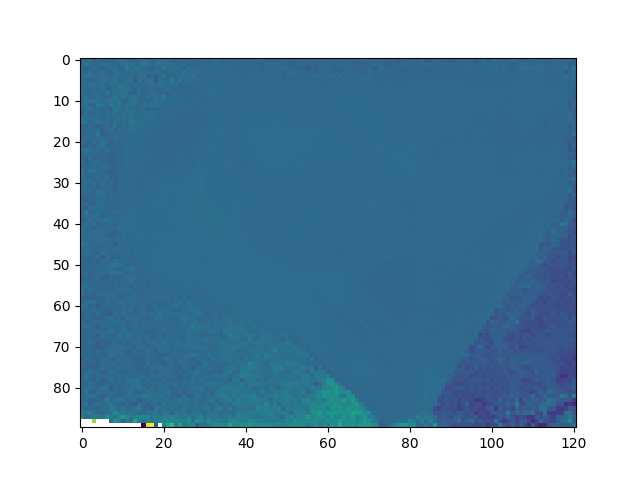

In [18]:
fig, axes = plt.subplots()
axes.imshow(result)

In [20]:
# Use a LiberTEM executor that plays well with the curren Dask scheduler
test_ctx = Context.make_with('threads')

In [21]:
(test_refined, test_indices) = refinement.run_refine(
    # Use DelayedJobExecutor
    ctx=test_ctx,
    # One could also use a dataset created from a HyperSpy signal here
    dataset=native_ds,
    zero=match.zero,
    a=match.a,
    b=match.b,
    matcher=matcher,
    match_pattern=pattern,
    indices=np.mgrid[-4:5, -4:5],
)

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: : 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthre

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthre

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug
RuntimeError: 
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug




RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Ex

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthr

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthre

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ign

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bugException ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: Undefined plan with nthreads. This is a bug
Exception ignored in: : Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthre

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: : Exception ignored in: Exception ignored in: 
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_w

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError:

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug: 


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_n

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
RuntimeError: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ig

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
E

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignor

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bugRuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeEr

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_w

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError:

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._f

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undef

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Excep

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfft

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeErrorExc

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan w

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ig

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Ru

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
E

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ign

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ig

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.p

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeE

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError:

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthr

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthr

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfft

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: : Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Undefined plan with nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._ff

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug




RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 

RuntimeErrorException ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ign

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null': 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError:

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Run

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
E

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug


'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfft

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nt

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: U

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: : Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Un

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ign

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ign

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
E

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Runtime

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exceptio

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
U

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Ex

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: 
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug



Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: : 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugExceptio

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfft

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefin

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignor

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nth

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: RuntimeErrorUndefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined p

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeErrorException ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
E

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: : Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError:

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bugUndefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Excepti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: Undefined plan with nthreads. This is a bug
Exception ignored in: Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthr

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.p

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefin

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeErrorUndefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorRuntimeErrorRuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: Undefined plan with nthreads. This is a

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: : Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'



'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeErrorUndefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthr

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthread

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug



Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: : Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugRuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undef

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_nul

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._f

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: : Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Except

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
E

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._f

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined p

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefin

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exce

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugRuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: RuntimeError
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug

RuntimeError: 
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthre

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug


'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with n

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Except

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
E

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtime

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is 

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthr

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: : Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ign

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Unde

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfft

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthre

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: RuntimeErrorException ignored in: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignor

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: U

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthre

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug



Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfft

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.p

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfft

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nt

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthr

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: U

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
: 
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfft

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.p

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_pla

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: 
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ign

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'py

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan w

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bugRuntimeError
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Ex

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_nul

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with n

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Excep

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug
: 
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: Exception ignored in: Exception ignored in: : Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug'pyfftw.p

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeErrorRuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Exception ignored in: Undefined plan with nthreads. This is a bug
: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fft

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._f

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug



: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Except

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Excepti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug




RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nth

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug



Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_n

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugExcept

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtime

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._f

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_pla

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorRuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyff

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Un

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: RuntimeErrorUndefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with n

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthre

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: : Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Except

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignor

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignor

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeErrorException ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: U

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthre

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: U

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyff

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: : Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bugException ignored in: : Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nth

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


Undefined plan with nthreads. This is a bug
RuntimeError: Undef

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Un

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErr

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Except

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fft

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: RuntimeError: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exc

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_nul

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This is a bug
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfft

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Except

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtime

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthre

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: Undefin

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Excep

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthread

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: 

RuntimeError: Undefined plan with nthreads. This is a bug

: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Ru

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Exception ignored in: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug


'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: U

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._f

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan w

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: 
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: 
Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pla

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthr

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan w

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfft

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_nu

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug




RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthre

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug: Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug


'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Und

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorRuntimeError: : Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ign

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfft

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorUndefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null': Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignor

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wi

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeE

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. T

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ig

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'RuntimeErrorUndefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug


'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: : Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 
Exception ignored in: 'pyfft

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception igno

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug



RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorRuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: : Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runt

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug



Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
'pyfftw.pyfftw._fftw_plan_w

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthrea

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignore

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: : 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runti

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: : Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtime

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 
: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyff

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError
: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugRuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthr

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug


Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bugUndefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.py

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'


RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Undefined plan with nthreads. This is a bug
Exception ignored in: 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined pl

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 
Exception ignored in: Exception ignored in: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: : 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This 

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

Undefined plan with nthreads. This is a bug
Exception ignored in: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Runtim

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_wit

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bugException ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This i

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Exception ignored in: Exception ignored in: Undefined plan with nthreads. This is a bug'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null''pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'

RuntimeError: Undefined plan with nthreads. This is a bug
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeErrorException ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
Exception ignored in: Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug
'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


RuntimeError: Undefined plan with nthreads. This is a bug

Exception ignored in: 'pyfftw.pyfftw._fftw_plan_with_nthreads_null'
RuntimeError: Undefined plan with nthreads. This is a bug


In [ ]:
np.allclose(refined['a'].data, test_refined['a'])

In [ ]:
pyfftw.cache